In [109]:
import sys
import json
import nltk
import re
from collections import Counter
import string
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('universal_tagset')
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt
from nltk import bigrams
from nltk.sentiment.vader import SentimentIntensityAnalyzer
#nltk.download('vader_lexicon')
from tqdm.notebook import tqdm
import numpy as np
import math
import statistics
%load_ext autoreload
%autoreload 1
import re 
# we are importing RedditProcessing.py and its contents
%aimport RedditProcessing
import pyLDAvis
import pyLDAvis.lda_model
from wordcloud import WordCloud
import sweetviz as sv

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/thorpanda/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/thorpanda/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package universal_tagset to
[nltk_data]     /Users/thorpanda/nltk_data...
[nltk_data]   Package universal_tagset is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/thorpanda/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [110]:
#!pip install sweetviz

In [111]:
reddit_odi = pd.read_csv("../../Data/Raw/hot_reddit_data_cricket_ODI_2.csv")

In [112]:
reddit_odi.head()

,Unnamed: 0,post_id,subreddit_name,subreddit_id,title,body,url,user_name,comments,score,created_date,Type,overall_content
0,0,181eyfx,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Hey everyone I did a post on who were the [sta...,https://www.reddit.com/r/Cricket/comments/181e...,FondantAggravating68,45.0,67,Thu Nov 23 04:42:32 2023,Post,NaN
1,1,kadb2o0,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,"Really liking these posts op, but this still d...",-,Fidelius_Rex,NaN,63,Thu Nov 23 10:34:00 2023,Comment,-
2,2,kadq4v1,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Crazy that Sachin's strike rate is higher than...,-,NaN,NaN,32,Thu Nov 23 12:25:37 2023,Comment,-
3,3,kaelxd1,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Yikes! I didn't know that there was SUCH a big...,-,hot-cuppa-chai,NaN,14,Thu Nov 23 16:46:45 2023,Comment,-
4,4,kad9r8r,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Fantastic,-,anchorschmidt8,NaN,9,Thu Nov 23 10:24:21 2023,Comment,-


In [113]:
# defining a function to tokenize data
def data_tokenizer(text, tokenizer):

    token_list = tokenizer.tokenize(text)
    token_list = [token.strip() for token in token_list]

    return token_list

In [114]:
def lemmatization(texts, allowed_postags=["NOUN", "ADJ", "VERB", "ADV"]):
    nlp = spacy.load("en_core_web_sm", disable=["parser", "ner"])
    texts_out = []
    for text in texts:
        doc = nlp(text)
        new_text = []
        for token in doc:
            if token.pos_ in allowed_postags:
                new_text.append(token.lemma_)
        final = " ".join(new_text)
        texts_out.append(final)
    return (texts_out)

In [115]:
def lower_case(text):
    return text.lower()

In [116]:
def tokenizer_remove_spae(text,tokenizer):
    # tokenise
    lTokens = tokenizer.tokenize(text)
    # strip whitespaces before and after
    lTokens = [token.strip() for token in lTokens]
    return lTokens

In [117]:
def processText(text, tokenizer, stemmer, stopwords):
    """
    Perform tokenisation, normalisation (lower case and stemming) and stopword and twitter keyword removal.

    @param text: reddit submission or comment text
    @param tokenizer: tokeniser used.
    @param stemmer: stemmer used.
    @param stopwords: list of stopwords used

    @returns: a list of processed tokens
    """

    # covert all to lower case
    text = text.lower()
    text = text.replace('\n\n', ' ') 
    text = re.sub(r"http\S+",' ', text)   #remove urls

    text=re.sub(r"\@\S+",' ',text)   #remove username
    
    text=re.sub(r'[^\w\s]','', text)  #remove punctuations
    
    text=re.sub('\d',' ',text ) #remove numbers as words 
    
    text=re.sub(' +',' ',text)  #Merge multiple spaces into one
    # tokenise
    lTokens = tokenizer.tokenize(text)
    # strip whitespaces before and after
    lTokens = [token.strip() for token in lTokens]
   
    # remove stopwords, digits
    stop_wordsrmv = [tok for tok in lTokens if tok not in stopwords and not tok.isdigit()]
    # stem (we use set to remove duplicates)
    lStemmedTokens = set([stemmer.stem(tok) for tok in stop_wordsrmv])
    return lStemmedTokens

<>:22: DeprecationWarning: invalid escape sequence '\d'
<>:22: DeprecationWarning: invalid escape sequence '\d'
/var/folders/6g/7khzkpj52_g5rbfvf4tck4zr0000gn/T/ipykernel_55926/1156713968.py:22: DeprecationWarning: invalid escape sequence '\d'
  text=re.sub('\d',' ',text ) #remove numbers as words


In [118]:
# tweet to use
postTokeniser = nltk.tokenize.TweetTokenizer()
# use the punctuation symbols defined in string.punctuation
lPunct = list(string.punctuation)
# use stopwords from nltk and a few other twitter specific terms like 'rt' (retweet)
lStopwords = nltk.corpus.stopwords.words('english') + lPunct + ['via']
# we use the popular Porter stemmer
postStemmer = nltk.stem.PorterStemmer()

In [119]:
#test
test=reddit_odi.copy()

In [120]:
termFreqCounter = Counter()
freqNum = 30

In [121]:
processed_title = []
processed_content = []
for i,row in test.iterrows():
    all_content = str(row["body"])
    submissionTitle = row["title"]
    title_list = processText(text=submissionTitle, tokenizer=postTokeniser, stemmer=postStemmer, stopwords=lStopwords)
    termFreqCounter.update(title_list)
    processed_title.append(' '.join( title_list))
    process_body = processText(text=all_content, tokenizer=postTokeniser, stemmer=postStemmer, stopwords=lStopwords)
    processed_content.append(' '.join(process_body))

#test["processed_title"] =processed_title
test["Processed_1"] = processed_content


In [122]:
# defining a pre-processor for vader
def vader_pre_processor(text):
    tokens = postTokeniser.tokenize(text)

    # removing digits
    digit_pattern = re.compile(r"\b\d+(\.\d+)?\b")
    # removing links
    link_pattern = re.compile(r'^http.*|.*\.com|^www.*')

    # filtering tokens
    tokens = [token.strip() for token in tokens if digit_pattern.match(token)==None and link_pattern.match(token)==None and token.strip()]

    # joining tokens togeter
    text = ' '.join(tokens)

    return text

In [123]:
#apply vader preprocessing
vader_tokens = []

for i,row in test.iterrows():
    body = str(row['body'])
    temp_tokens = vader_pre_processor(body)
    vader_tokens.append(temp_tokens)

In [124]:
test.loc[:, 'Processed_2'] = vader_tokens

In [125]:
test.head()

,Unnamed: 0,post_id,subreddit_name,subreddit_id,title,body,url,user_name,comments,score,created_date,Type,overall_content,Processed_1,Processed_2
0,0,181eyfx,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Hey everyone I did a post on who were the [sta...,https://www.reddit.com/r/Cricket/comments/181e...,FondantAggravating68,45.0,67,Thu Nov 23 04:42:32 2023,Post,NaN,order play middl dl watson requir here doesnt ...,Hey everyone I did a post on who were the [ st...
1,1,kadb2o0,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,"Really liking these posts op, but this still d...",-,Fidelius_Rex,NaN,63,Thu Nov 23 10:34:00 2023,Comment,-,problem like mwaugh watson realli op doesnt fi...,"Really liking these posts op , but this still ..."
2,2,kadq4v1,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Crazy that Sachin's strike rate is higher than...,-,NaN,NaN,32,Thu Nov 23 12:25:37 2023,Comment,-,crazi rohit despit sachin rate strike higher v...,Crazy that Sachin's strike rate is higher than...
3,3,kaelxd1,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Yikes! I didn't know that there was SUCH a big...,-,hot-cuppa-chai,NaN,14,Thu Nov 23 16:46:45 2023,Comment,-,saw that srtganguli overal didnt alway would c...,Yikes ! I didn't know that there was SUCH a bi...
4,4,kad9r8r,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Fantastic,-,anchorschmidt8,NaN,9,Thu Nov 23 10:24:21 2023,Comment,-,fantast,Fantastic


In [126]:
df_renamed = test[['post_id', 'created_date', 'user_name', 'score', 'comments', 'body', 'Type', 'Processed_1', 'Processed_2']].rename(columns={
    'post_id': 'Post_id',
    'created_date': 'Time',
    'user_name': 'Author',
    'score': 'Score',
    'comments': 'No_comments',
    'body': 'Body',
    'Type': 'Type',
    'Processed_1': 'Processed_1',
    'Processed_2': 'Processed_2'
})



In [127]:
df_renamed.head()


,Post_id,Time,Author,Score,No_comments,Body,Type,Processed_1,Processed_2
0,181eyfx,Thu Nov 23 04:42:32 2023,FondantAggravating68,67,45.0,Hey everyone I did a post on who were the [sta...,Post,order play middl dl watson requir here doesnt ...,Hey everyone I did a post on who were the [ st...
1,kadb2o0,Thu Nov 23 10:34:00 2023,Fidelius_Rex,63,NaN,"Really liking these posts op, but this still d...",Comment,problem like mwaugh watson realli op doesnt fi...,"Really liking these posts op , but this still ..."
2,kadq4v1,Thu Nov 23 12:25:37 2023,NaN,32,NaN,Crazy that Sachin's strike rate is higher than...,Comment,crazi rohit despit sachin rate strike higher v...,Crazy that Sachin's strike rate is higher than...
3,kaelxd1,Thu Nov 23 16:46:45 2023,hot-cuppa-chai,14,NaN,Yikes! I didn't know that there was SUCH a big...,Comment,saw that srtganguli overal didnt alway would c...,Yikes ! I didn't know that there was SUCH a bi...
4,kad9r8r,Thu Nov 23 10:24:21 2023,anchorschmidt8,9,NaN,Fantastic,Comment,fantast,Fantastic


In [20]:
df_renamed.to_csv("redditODI-final.csv")

In [128]:
# print out most common terms
for term, count in termFreqCounter.most_common(freqNum):
    print(term + ': ' + str(count))

odi: 52676
match: 45970
thread: 45705
vs: 42680
india: 24828
st: 16102
australia: 15770
nd: 14840
rd: 12644
england: 11782
new: 9492
zealand: 9394
africa: 8690
south: 8690
west: 6565
indi: 6565
lanka: 5885
sri: 5885
pakistan: 5241
bangladesh: 3937
v: 3405
th: 3284
afghanistan: 1798
cup: 1230
world: 1230
kohli: 1071
cricket: 1066
score: 1000
seri: 809
player: 789


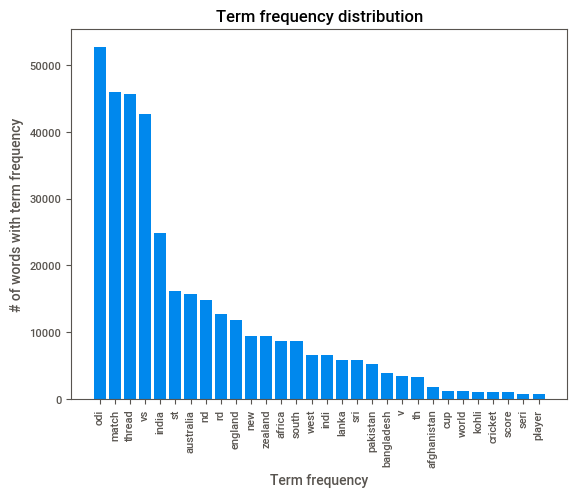

In [129]:
#term freq unigram
# construct the x and y values
y = [count for tag, count in termFreqCounter.most_common(freqNum)]
x = [tag for tag, count in termFreqCounter.most_common(freqNum)]

# use matplotlib bar chat to plot this
plt.bar(x, y)
plt.title("Term frequency distribution")
plt.ylabel('# of words with term frequency')
plt.xlabel('Term frequency')
plt.xticks(rotation=90)

plt.show()

In [130]:
test["created_date"] = pd.to_datetime(df_renamed["Time"])

In [131]:
test

,Unnamed: 0,post_id,subreddit_name,subreddit_id,title,body,url,user_name,comments,score,created_date,Type,overall_content,Processed_1,Processed_2
0,0,181eyfx,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Hey everyone I did a post on who were the [sta...,https://www.reddit.com/r/Cricket/comments/181e...,FondantAggravating68,45.0,67,2023-11-23 04:42:32,Post,NaN,order play middl dl watson requir here doesnt ...,Hey everyone I did a post on who were the [ st...
1,1,kadb2o0,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,"Really liking these posts op, but this still d...",-,Fidelius_Rex,NaN,63,2023-11-23 10:34:00,Comment,-,problem like mwaugh watson realli op doesnt fi...,"Really liking these posts op , but this still ..."
2,2,kadq4v1,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Crazy that Sachin's strike rate is higher than...,-,NaN,NaN,32,2023-11-23 12:25:37,Comment,-,crazi rohit despit sachin rate strike higher v...,Crazy that Sachin's strike rate is higher than...
3,3,kaelxd1,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Yikes! I didn't know that there was SUCH a big...,-,hot-cuppa-chai,NaN,14,2023-11-23 16:46:45,Comment,-,saw that srtganguli overal didnt alway would c...,Yikes ! I didn't know that there was SUCH a bi...
4,4,kad9r8r,r/Cricket,t5_2qhe0,The Statistically Greatest ODI Openers - 3000 ...,Fantastic,-,anchorschmidt8,NaN,9,2023-11-23 10:24:21,Comment,-,fantast,Fantastic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53141,53141,lqwms9m,r/Cricket,t5_2qhe0,Ireland beat South Africa by 69 runs in the 3r...,Ireland really underperformed in the T20 WC. O...,-,Smooth-Mix-4357,NaN,2,2024-10-08 18:21:18,Comment,-,game underperform ireland realli wc theyv perf...,Ireland really underperformed in the T20 WC . ...
53142,53142,lqu5vja,r/Cricket,t5_2qhe0,Ireland beat South Africa by 69 runs in the 3r...,What is South Africa doing?! This downfall is ...,-,pizzagamer35,NaN,3,2024-10-08 07:54:36,Comment,-,africa crazi south downfal,What is South Africa doing ? ! This downfall i...
53143,53143,lquajbj,r/Cricket,t5_2qhe0,Ireland beat South Africa by 69 runs in the 3r...,👑❤️,-,SeaLow3024,NaN,1,2024-10-08 08:19:28,Comment,-,,👑 ❤ ️
53144,53144,lqvwdn9,r/Cricket,t5_2qhe0,Ireland beat South Africa by 69 runs in the 3r...,Nice those 69 runs😂💀,-,Obvious-Profit-5597,NaN,1,2024-10-08 14:14:20,Comment,-,nice run,Nice those runs 😂 💀


In [132]:
test["created_date"]

0       2023-11-23 04:42:32
1       2023-11-23 10:34:00
2       2023-11-23 12:25:37
3       2023-11-23 16:46:45
4       2023-11-23 10:24:21
                ...        
53141   2024-10-08 18:21:18
53142   2024-10-08 07:54:36
53143   2024-10-08 08:19:28
53144   2024-10-08 14:14:20
53145   2024-10-08 18:01:36
Name: created_date, Length: 53146, dtype: datetime64[ns]

In [133]:
test['D_created_date'] = test['created_date'].dt.strftime('%y-%m')
new = test[['D_created_date','post_id']].groupby('D_created_date').count().reset_index()
new

,D_created_date,post_id
0,19-07,75
1,20-01,1368
2,20-11,1020
3,20-12,516
4,21-03,1458
5,21-07,1589
6,21-12,254
7,22-01,1452
8,22-02,1372
9,22-03,665


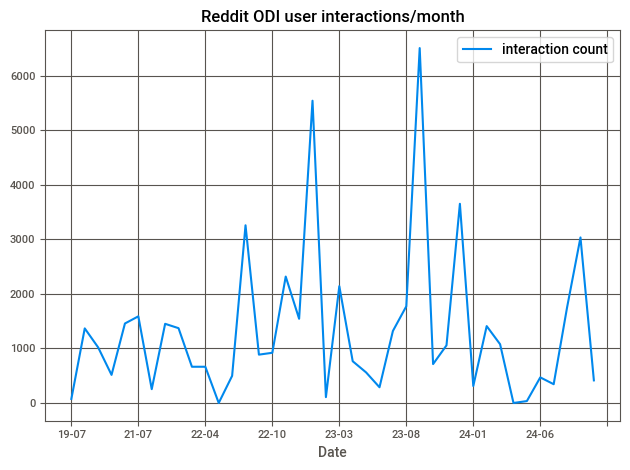

In [134]:

month_c = new[['D_created_date','post_id']]
# tell pandas that the date column is the one we use for indexing (or x-axis)
month_c.set_index('D_created_date', inplace=True)
# pandas makes a guess at the type of the columns, but to make sure it doesn't get it wrong, we set the sentiment
# column to floats
month_c['post_id'] = month_c['post_id'].apply(pd.to_numeric)
month_c.rename(columns={'post_id': 'interaction count'}, inplace=True)
month_c.plot()

plt.title("Reddit ODI user interactions/month")
plt.xlabel("Date")
plt.tight_layout()
plt.grid(True)
plt.show()

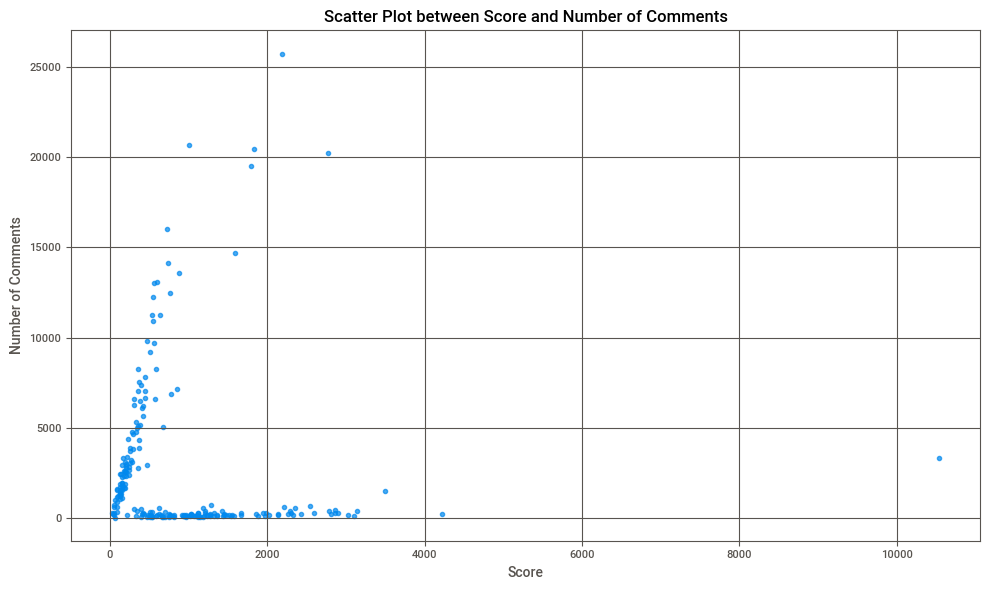

In [135]:
# to plot score vs no_comments ignoring T20 final post
posts = df_renamed[df_renamed['Type']=='Post']

# score vs no_of comments
plt.figure(figsize=(10, 6))
plt.scatter(posts['Score'], posts['No_comments'], alpha=0.7)
plt.xlabel('Score')
plt.ylabel('Number of Comments')
plt.title('Scatter Plot between Score and Number of Comments')
plt.grid(True)
plt.tight_layout()
plt.show()

In [136]:
my_report = sv.analyze(df_renamed)
my_report.show_html()

/opt/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/opt/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/opt/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
/opt/anaconda3/lib/python3.11/site-packages/ipywidgets/widgets/widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecate

                                             |      | [  0%]   00:00 -> (? left)

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


## sentiment analysis

In [137]:
vader_analyzer = SentimentIntensityAnalyzer()

In [138]:
def vaderPrintTokens(lTokens, dSentimentScores):
    """
    Print out the tokens and sentiment score.
    
    @param lTokens: List of tokens to print and colour.
    @dSentimentScores: Dictionary of sentiment from Vader.

    """
    print(*lTokens, sep=', ')
    for cat,score in dSentimentScores.items():
        print('{0}: {1}, '.format(cat, score), end='')
    print()

def vaderSentimentAnalysis(redd_df, bPrint, tweetProcessor):
    """
    Use Vader lexicons instead of a raw positive and negative word count.

    @param redd_df: name of input df containing a json formated tweet dump
    @param bPrint: whether to print the stream of tokens and sentiment.  Uses colorama to highlight sentiment words.
    @param tweetProcessor: TweetProcessing object, used to pre-process each tweet.

    @returns: list of tweets, in the format of [date, sentiment]
    """

    # this is the vader sentiment analyser, part of nltk
    sentAnalyser = SentimentIntensityAnalyzer()


    lSentiment = []
    # open rows , one by one
    for i,row in redd_df.iterrows():  
            postText = row["Processed_2"]
            
            # pre-process the post text
            lTokens = redditProcessor.process(postText)

            # this computes the sentiment scores (called polarity score in nltk, but mean same thing essentially)
            # see workshop sheet for what dSentimentScores holds
            dSentimentScores = sentAnalyser.polarity_scores(" ".join(lTokens))

            # save the  sentiment of each post (used for time series)
            lSentiment.append( dSentimentScores['compound'])

    
            if bPrint:
                print(row["Processed_2"], dSentimentScores)
                
       
                    
                    
    return lSentiment



In [139]:
from nltk.tokenize import TweetTokenizer

tweetTokenizer = TweetTokenizer()
redditProcessor = RedditProcessing.RedditProcessing(tweetTokenizer, lStopwords)

In [140]:
lSentiment = []
flagPrint = True
lSentiment = vaderSentimentAnalysis(df_renamed, flagPrint, redditProcessor)

Hey everyone I did a post on who were the [ statistically greatest finishers ] ( ) and a post on who were the statistically [ greatest middle order batters ] ( ) . This post is about who the greatest openers are . The minimum requirement is runs as an opener . Each batter has been given adjusted batting averages and strike rates . * * Methodology : * * This is runs scored vs the test playing nations minus Ireland . Adjusted Average = Player Opening Average / Player Era Opening Average \ * Current Era Opening Average ( post jan ) Adjusted SR = Player Opening Strike Rate / Player Era Opening Strike Rate \ * Current Era Opening Strike Rate ( post jan ) Bat Rating = Geometric mean of the adjusted average and strike rate . Limitations : Obviously the rating doesn't take volume , opposition , peaks and context into account . Also you are allowed to have different preferences and that's perfectly all right . This is just a visualisation of the batters . Here's the [ link ] ( ) so you can inte

In [198]:
df_renamed["vadar_sentiment"] = lSentiment

In [ ]:
filtered_df = df_renamed[df_renamed['created_date'] > '2023-01-01']
filtered_df["created_date"] = filtered_df["created_date"].dt.date


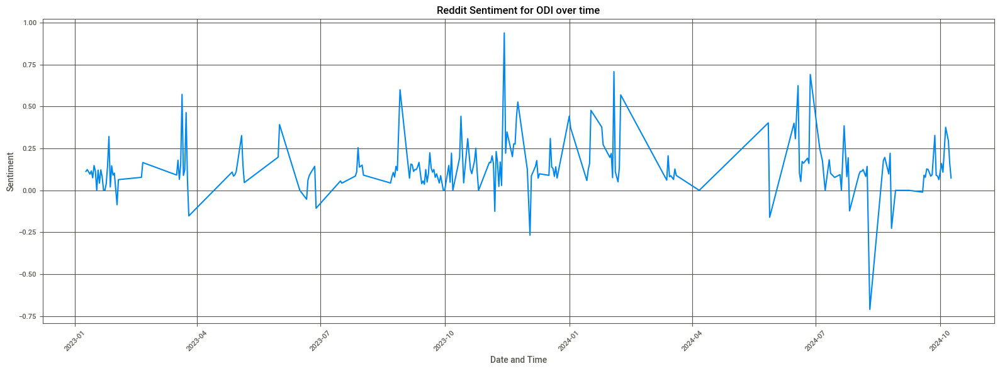

In [199]:



odi_sentiment_aggregated = filtered_df.groupby('created_date')['vadar_sentiment'].mean().reset_index()
# plotting sentiment
plt.figure(figsize=(16, 6))
plt.plot(odi_sentiment_aggregated['created_date'],odi_sentiment_aggregated['vadar_sentiment'],linestyle='-')
plt.title('Reddit Sentiment for ODI over time')
plt.xlabel('Date and Time')
plt.ylabel('Sentiment')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


# topic modeling

In [183]:
comment_text = df_renamed['Processed_1'].tolist()

In [163]:
comment_text
remove_words = ['shit','fuck']
comment_text = [word for word in comment_text if word not in remove_words]


In [184]:
# creating the count vectorzer object
tfVectorizer = CountVectorizer(max_df=0.95, min_df=80, stop_words='english')
# generating the count vector
tf = tfVectorizer.fit_transform(comment_text)
# list of words in count vector
tfFeatureNames = tfVectorizer.get_feature_names_out()

In [185]:
len(tfFeatureNames)

969

In [167]:
#LDA tuning
perplexity_scores = []
topics_range = range(2, 10, 1)

for n_topics in topics_range:
    #Train the LDA model for each topic number
    ldaModel = LatentDirichletAllocation(n_components=n_topics, max_iter=10, learning_method='online', random_state=42)
    ldaModel.fit(tf)
    
    # Compute the perplexity score for the model
    perplexity = ldaModel.perplexity(tf)
    perplexity_scores.append(perplexity)
    
    print(f"Number of topics: {n_topics}, Perplexity: {perplexity}")

#Find the number of topics that minimizes perplexity
best_n_topics = topics_range[np.argmin(perplexity_scores)]
print(f"The best number of topics is: {best_n_topics}")

Number of topics: 2, Perplexity: 607.9627637694491
Number of topics: 3, Perplexity: 651.8422219454297
Number of topics: 4, Perplexity: 691.8280520548627
Number of topics: 5, Perplexity: 730.4600170606293
Number of topics: 6, Perplexity: 754.0759156942804
Number of topics: 7, Perplexity: 779.5638814848517
Number of topics: 8, Perplexity: 810.4980946117716
Number of topics: 9, Perplexity: 825.1981502305738
The best number of topics is: 2


In [186]:
best_n_topics = 4
ldaModel = LatentDirichletAllocation(n_components =best_n_topics, max_iter=20, learning_method='online').fit(tf)

In [187]:
#visualize topics
def display_topics(model, featureNames, numTopWords):
    """
    Prints out the most associated words for each feature.

    @param model: lda model.
    @param featureNames: list of strings, representing the list of features/words.
    @param numTopWords: number of words to print per topic.
    """

    # print out the topic distributions
    for topicId, lTopicDist in enumerate(model.components_):
        print("Topic %d:" % (topicId))
        print(" ".join([featureNames[i] for i in lTopicDist.argsort()[:-numTopWords - 1:-1]]))

In [188]:
wordNumToDisplay = 15


In [189]:
#display_topics(ldaModel, tfFeatureNames, wordNumToDisplay)

In [190]:
# TODO: Add the pyLDAvis code here
# note if you also implemented the word cloud, that will display first, then once you close that
# file, then this will display
# Answer to exercise 2
panel = pyLDAvis.lda_model.prepare(ldaModel, tf, tfVectorizer, mds='tsne')
pyLDAvis.display(panel)

In [191]:
def displayWordcloud(model, featureNames):
    """
    Displays the word cloud of the topic distributions, stored in model.

    @param model: lda model.
    @param featureNames: list of strings, representing the list of features/words.
    """

    # this normalises each row/topic to sum to one
    # use this normalisedComponents to display your wordclouds
    normalisedComponents = model.components_ / model.components_.sum(axis=1)[:, np.newaxis]

  
    
    topicNum = len(model.components_)
    # number of wordclouds for each row
    plotColNum = 3
    # number of wordclouds for each column
    plotRowNum = int(math.ceil(topicNum / plotColNum))

    for topicId, lTopicDist in enumerate(normalisedComponents):
        lWordProb = {featureNames[i] : wordProb for i,wordProb in enumerate(lTopicDist)}
        wordcloud = WordCloud(background_color='black')
        wordcloud.fit_words(frequencies=lWordProb)
        plt.subplot(plotRowNum, plotColNum, topicId+1)
        plt.title('Topic %d:' % (topicId+1))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")

    plt.show(block=True)

In [192]:
#displayWordcloud(ldaModel,tfFeatureNames)

## topic distribution analysis

In [193]:
topics_distribution = ldaModel.transform(tf)

In [194]:
topics_distribution.shape

(53146, 4)

In [195]:
dominant_topic = np.argmax(topics_distribution, axis=1)
#dominant_topic

In [180]:
tfFeatureNames.shape

(967,)

In [181]:
uniq_topic_com = df_renamed[['Processed_1','Post_id']]
uniq_topic_com.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53146 entries, 0 to 53145
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Processed_1  53146 non-null  object
 1   Post_id      53146 non-null  object
dtypes: object(2)
memory usage: 830.5+ KB


In [200]:
uniq_topic_com["topic_id"] = dominant_topic
uniq_topic_com

/var/folders/6g/7khzkpj52_g5rbfvf4tck4zr0000gn/T/ipykernel_55926/1710867386.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uniq_topic_com["topic_id"] = dominant_topic


,Processed_1,Post_id,topic_id
0,order play middl dl watson requir here doesnt ...,181eyfx,3
1,problem like mwaugh watson realli op doesnt fi...,kadb2o0,0
2,crazi rohit despit sachin rate strike higher v...,kadq4v1,0
3,saw that srtganguli overal didnt alway would c...,kaelxd1,2
4,fantast,kad9r8r,1
...,...,...,...
53141,game underperform ireland realli wc theyv perf...,lqwms9m,2
53142,africa crazi south downfal,lqu5vja,2
53143,,lquajbj,0
53144,nice run,lqvwdn9,1


In [55]:
comb_tit = pd.merge(df_renamed, uniq_topic_com[["Processed_1","topic_id","Post_id"]], on='Post_id', how='inner')
comb_tit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53146 entries, 0 to 53145
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Post_id          53146 non-null  object        
 1   Time             53146 non-null  object        
 2   Author           47487 non-null  object        
 3   Score            53146 non-null  int64         
 4   No_comments      222 non-null    float64       
 5   Body             53044 non-null  object        
 6   Type             53146 non-null  object        
 7   Processed_1_x    53146 non-null  object        
 8   Processed_2      53146 non-null  object        
 9   vadar_sentiment  53146 non-null  float64       
 10  created_date     53146 non-null  datetime64[ns]
 11  Processed_1_y    53146 non-null  object        
 12  topic_id         53146 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(2), object(8)
memory usage: 5.3+ MB


# topic 1

In [56]:
filtered1 = comb_tit[comb_tit["topic_id"]==0]
max_value = filtered1['vadar_sentiment'].max()
content = filtered1["Body"][filtered1["vadar_sentiment"]==max_value]
print(content.values[0]) 

Steve Smith Diary Update

Dear Diary,

I am feeling very happy because two of my friends have scored a century! My friend Trav who used to have a scary moustache made 152 runs which is a very big number, and Davey made 106 runs which is not as big a number, but it was Davey’s first century in over 1000 days, which is a really big number! Davey was very happy when he scored his century, and he did a big jump and gave Trav a big hug. Patty asked Davey and Trav to give a talk to us at the innings break to “give the team some much needed emotional sustenance as we prepare for the second half of this cricketing endeavour”. Davey said that there was not much that he wanted to say, but he did say that it was “about fucking time” and that we “had better not fucking lose this match after it’s been handed to you on a fucking platter”. Trav said that he was very happy with all of us and that we should all bring something called “Redbacks energy” to our bowling. That made Trav’s Redbacks friend Al

In [57]:
max_value = filtered1['vadar_sentiment'].min()
content = filtered1["Body"][filtered1["vadar_sentiment"]==max_value]
print(content.values[0]) 

>The infrastructure of the stadium is awful. High fences, obscured points of view and awful, awful seating arrangement. Add to that, they don't even have fucking amenities. Sports are meant to be enjoyed with food and drinks and the national stadium is a barren shithole in an oasis of top-tier food (fuck off Lahoris). Shitty ass warm drinks couped with shitty ass E. Coli infested garbage.  
>  
>Add to that its fucking hell to actually get into the stadium. Even though you have e-tickets the motherfuckers expect you to print it out, and not only that, but print it out from their approved vendors (madarchods the lot of you).  
>  
>Furthermore, the infrastructure around the city is fuckin awful rn. Since we only get things done close to elections the entire city is in upheaval because every fucking road is under construction. It's hell just to reach the stadium and even more hell to go through security.

Copying this again as to why no crowds


/var/folders/6g/7khzkpj52_g5rbfvf4tck4zr0000gn/T/ipykernel_55926/4265865160.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  series_v[['vadar_sentiment']] = series_v[['vadar_sentiment']].apply(pd.to_numeric)
/var/folders/6g/7khzkpj52_g5rbfvf4tck4zr0000gn/T/ipykernel_55926/4265865160.py:10: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  vadarSeries = series_v.resample('1H').mean()


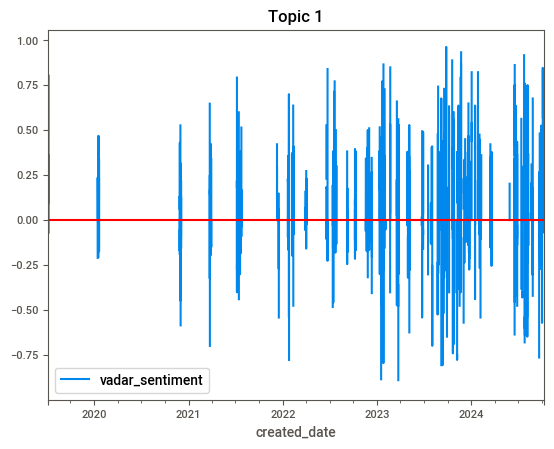

In [99]:
# we are using pandas for this, but first we need to get it into a pandas data frame structure
series_v = filtered1[['created_date','vadar_sentiment']]
# tell pandas that the date column is the one we use for indexing (or x-axis)
series_v.set_index('created_date', inplace=True)

series_v[['vadar_sentiment']] = series_v[['vadar_sentiment']].apply(pd.to_numeric)



vadarSeries = series_v.resample('1H').mean()
# this plots and shows the time series
vadarSeries.plot()
plt.axhline(y=0, color='r', linestyle='-')
plt.title("Topic 1")

plt.show()

## topic 2

In [100]:
filtered1 = comb_tit[comb_tit["topic_id"]==1]
max_value = filtered1['vadar_sentiment'].max()
content = filtered1["Body"][filtered1["vadar_sentiment"]==max_value]
print(content.values[0]) 

Steve Smith Diary Update

Dear Diary

We are playing more ODI cricket against England! I got to score lots of runs in Adelaide, which was very fun, because I like scoring runs, and playing with my friends. Now we are in Sydney, and I hope that I get to make lots of runs here too. Before our match though, Patty had some big news…….he was not going to be captain in this match! We were all very surprised because Patty has only been captain for one match, but Patty said that “as a collective group, we are approaching a particularly hectic period in our schedule, and as such I feel that a tactical break in my captaincy in a low-stakes situation would be beneficial to the overall demeanour of the team”. I did not know what Patty meant, but Mitch said that Patty just wanted to put his feet up and have a good lie down. I like Patty and I hope that he has a good rest so that he can come back and play cricket with us again!

We were all not sure who was going to be captain instead of Patty. Mitc

In [101]:
max_value = filtered1['vadar_sentiment'].min()
content = filtered1["Body"][filtered1["vadar_sentiment"]==max_value]
print(content.values[0]) 

Mitch Marsh's inning is poison to children's minds and it creates a fake world for them to live in. His inning introduces faster strike rate in ODI at a young age and has very graphic and violent scenes. This carries over into adulthood and creates these lazy, nasty, hideous slobs that were once your children that now thinks everybody should go bang bang and read Mitch's scorecard at least 10 times a day. It also consumes your soul and wastes time that could be used to watch real ODI cricket, watch 60 minutes of cover drive for singles, and contribute something to society. The people who like  Mitch are not the problem, Marsh himself is. His innings against india is the root of all problems, cancer, war, Africa, and the Nazis. Since people watch it on the TV so much, it uses electricity and is the reason why the oil reserves will run out . watching him bat causes cancer because it has been proven TV screens emit radiation and radiation causes cancer. African leaders in Africa are corru

/var/folders/6g/7khzkpj52_g5rbfvf4tck4zr0000gn/T/ipykernel_55926/522533479.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  series_v[['vadar_sentiment']] = series_v[['vadar_sentiment']].apply(pd.to_numeric)
/var/folders/6g/7khzkpj52_g5rbfvf4tck4zr0000gn/T/ipykernel_55926/522533479.py:10: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  vadarSeries = series_v.resample('1H').mean()


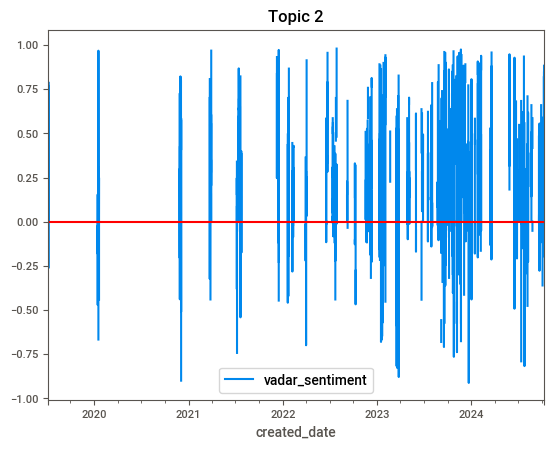

In [102]:
# we are using pandas for this, but first we need to get it into a pandas data frame structure
series_v = filtered1[['created_date','vadar_sentiment']]
# tell pandas that the date column is the one we use for indexing (or x-axis)
series_v.set_index('created_date', inplace=True)

series_v[['vadar_sentiment']] = series_v[['vadar_sentiment']].apply(pd.to_numeric)



vadarSeries = series_v.resample('1H').mean()
# this plots and shows the time series
vadarSeries.plot()
plt.axhline(y=0, color='r', linestyle='-')
plt.title("Topic 2")

plt.show()

## topic 3

In [103]:
filtered1 = comb_tit[comb_tit["topic_id"]==2]
max_value = filtered1['vadar_sentiment'].max()
content = filtered1["Body"][filtered1["vadar_sentiment"]==max_value]
print(content.values[0]) 

NZ currently at 2 in ODI rankings

If they win at least 3, move to 1

Win 2, move to 3

Win 1, move to 5

PAK at 5

Win 5, move to 1

Win 4, move to 3

Win 1 to 3, remain at 5


In [104]:
max_value = filtered1['vadar_sentiment'].min()
content = filtered1["Body"][filtered1["vadar_sentiment"]==max_value]
print(content.values[0]) 

Stop fucking blaming individuals we are losing because we failed as a team.Our star batsman and bowler both had bad day.In bowling everyone was shit today except Shami.


/var/folders/6g/7khzkpj52_g5rbfvf4tck4zr0000gn/T/ipykernel_55926/3122202422.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  series_v[['vadar_sentiment']] = series_v[['vadar_sentiment']].apply(pd.to_numeric)
/var/folders/6g/7khzkpj52_g5rbfvf4tck4zr0000gn/T/ipykernel_55926/3122202422.py:10: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  vadarSeries = series_v.resample('1H').mean()


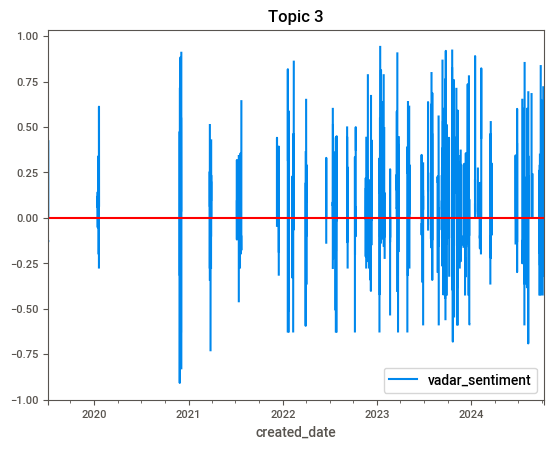

In [105]:
# we are using pandas for this, but first we need to get it into a pandas data frame structure
series_v = filtered1[['created_date','vadar_sentiment']]
# tell pandas that the date column is the one we use for indexing (or x-axis)
series_v.set_index('created_date', inplace=True)

series_v[['vadar_sentiment']] = series_v[['vadar_sentiment']].apply(pd.to_numeric)



vadarSeries = series_v.resample('1H').mean()
# this plots and shows the time series
vadarSeries.plot()
plt.axhline(y=0, color='r', linestyle='-')
plt.title("Topic 3")

plt.show()

## topic 4

In [106]:
filtered1 = comb_tit[comb_tit["topic_id"]==3]
max_value = filtered1['vadar_sentiment'].max()
content = filtered1["Body"][filtered1["vadar_sentiment"]==max_value]
print(content.values[0]) 

Hey ricky! 

You and gilly have obviously been one of the finest to have ever played the sport, and have also been one of the best readers of the game in terms of assessing the conditions, tactics, predictions, pretty much every aspect which also explains the success you had as a captain. What do you think makes a good reader of the game, and is it a good move to have the best reader of the game as your captain/leader. Is it something that you look for as a coach. 

Looking forward to you having great success at punjab kings. Cheers


In [107]:
max_value = filtered1['vadar_sentiment'].min()
content = filtered1["Body"][filtered1["vadar_sentiment"]==max_value]
print(content.values[0]) 

STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING STOP JINXING


/var/folders/6g/7khzkpj52_g5rbfvf4tck4zr0000gn/T/ipykernel_55926/491485569.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  series_v[['vadar_sentiment']] = series_v[['vadar_sentiment']].apply(pd.to_numeric)
/var/folders/6g/7khzkpj52_g5rbfvf4tck4zr0000gn/T/ipykernel_55926/491485569.py:10: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  vadarSeries = series_v.resample('1H').mean()


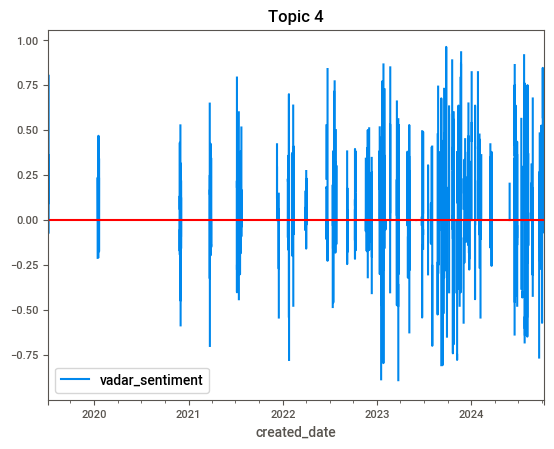

In [108]:
# we are using pandas for this, but first we need to get it into a pandas data frame structure
series_v = filtered1[['created_date','vadar_sentiment']]
# tell pandas that the date column is the one we use for indexing (or x-axis)
series_v.set_index('created_date', inplace=True)

series_v[['vadar_sentiment']] = series_v[['vadar_sentiment']].apply(pd.to_numeric)



vadarSeries = series_v.resample('1H').mean()
# this plots and shows the time series
vadarSeries.plot()
plt.axhline(y=0, color='r', linestyle='-')
plt.title("Topic 4")

plt.show()

## top teams

In [208]:
df_renamed.head()

,Post_id,Time,Author,Score,No_comments,Body,Type,Processed_1,Processed_2,vadar_sentiment,created_date
0,181eyfx,Thu Nov 23 04:42:32 2023,FondantAggravating68,67,45.0,Hey everyone I did a post on who were the [sta...,Post,order play middl dl watson requir here doesnt ...,Hey everyone I did a post on who were the [ st...,0.9894,2023-11-23 04:42:32
1,kadb2o0,Thu Nov 23 10:34:00 2023,Fidelius_Rex,63,NaN,"Really liking these posts op, but this still d...",Comment,problem like mwaugh watson realli op doesnt fi...,"Really liking these posts op , but this still ...",0.4201,2023-11-23 10:34:00
2,kadq4v1,Thu Nov 23 12:25:37 2023,NaN,32,NaN,Crazy that Sachin's strike rate is higher than...,Comment,crazi rohit despit sachin rate strike higher v...,Crazy that Sachin's strike rate is higher than...,-0.5943,2023-11-23 12:25:37
3,kaelxd1,Thu Nov 23 16:46:45 2023,hot-cuppa-chai,14,NaN,Yikes! I didn't know that there was SUCH a big...,Comment,saw that srtganguli overal didnt alway would c...,Yikes ! I didn't know that there was SUCH a bi...,0.7096,2023-11-23 16:46:45
4,kad9r8r,Thu Nov 23 10:24:21 2023,anchorschmidt8,9,NaN,Fantastic,Comment,fantast,Fantastic,0.5574,2023-11-23 10:24:21


In [209]:
# Define the country groups
countries = {
    'India': ['India', 'Ind', 'india', 'ind'],
    'Australia': ['Australia', 'Aus', 'aus'],
    'England': ['England', 'Eng', 'eng']
}

def find_countries(text):
    if isinstance(text, str):  # Ensure text is a string
        found_countries = []
        for country, variations in countries.items():
            if any(variation in text for variation in variations):
                found_countries.append(country)
        return found_countries if found_countries else ['Not Found']
    else:
        return ['Not Found']  # Handle NaN or non-string values
# Apply the function to create the 'Country' column
df_renamed['Country'] = df_renamed['Body'].apply(find_countries)

In [210]:
df_renamed

,Post_id,Time,Author,Score,No_comments,Body,Type,Processed_1,Processed_2,vadar_sentiment,created_date,Country
0,181eyfx,Thu Nov 23 04:42:32 2023,FondantAggravating68,67,45.0,Hey everyone I did a post on who were the [sta...,Post,order play middl dl watson requir here doesnt ...,Hey everyone I did a post on who were the [ st...,0.9894,2023-11-23 04:42:32,"[India, England]"
1,kadb2o0,Thu Nov 23 10:34:00 2023,Fidelius_Rex,63,NaN,"Really liking these posts op, but this still d...",Comment,problem like mwaugh watson realli op doesnt fi...,"Really liking these posts op , but this still ...",0.4201,2023-11-23 10:34:00,[Australia]
2,kadq4v1,Thu Nov 23 12:25:37 2023,NaN,32,NaN,Crazy that Sachin's strike rate is higher than...,Comment,crazi rohit despit sachin rate strike higher v...,Crazy that Sachin's strike rate is higher than...,-0.5943,2023-11-23 12:25:37,[Not Found]
3,kaelxd1,Thu Nov 23 16:46:45 2023,hot-cuppa-chai,14,NaN,Yikes! I didn't know that there was SUCH a big...,Comment,saw that srtganguli overal didnt alway would c...,Yikes ! I didn't know that there was SUCH a bi...,0.7096,2023-11-23 16:46:45,[Not Found]
4,kad9r8r,Thu Nov 23 10:24:21 2023,anchorschmidt8,9,NaN,Fantastic,Comment,fantast,Fantastic,0.5574,2023-11-23 10:24:21,[Not Found]
...,...,...,...,...,...,...,...,...,...,...,...,...
53141,lqwms9m,Tue Oct 8 18:21:18 2024,Smooth-Mix-4357,2,NaN,Ireland really underperformed in the T20 WC. O...,Comment,game underperform ireland realli wc theyv perf...,Ireland really underperformed in the T20 WC . ...,0.7650,2024-10-08 18:21:18,[Not Found]
53142,lqu5vja,Tue Oct 8 07:54:36 2024,pizzagamer35,3,NaN,What is South Africa doing?! This downfall is ...,Comment,africa crazi south downfal,What is South Africa doing ? ! This downfall i...,-0.3400,2024-10-08 07:54:36,[Not Found]
53143,lquajbj,Tue Oct 8 08:19:28 2024,SeaLow3024,1,NaN,👑❤️,Comment,,👑 ❤ ️,0.0000,2024-10-08 08:19:28,[Not Found]
53144,lqvwdn9,Tue Oct 8 14:14:20 2024,Obvious-Profit-5597,1,NaN,Nice those 69 runs😂💀,Comment,nice run,Nice those runs 😂 💀,0.4215,2024-10-08 14:14:20,[Not Found]


In [211]:
filtered_df = df_renamed[df_renamed['Country'].apply(lambda x: x != ['Not Found'])]
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10027 entries, 0 to 53136
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Post_id          10027 non-null  object        
 1   Time             10027 non-null  object        
 2   Author           9040 non-null   object        
 3   Score            10027 non-null  int64         
 4   No_comments      101 non-null    float64       
 5   Body             10027 non-null  object        
 6   Type             10027 non-null  object        
 7   Processed_1      10027 non-null  object        
 8   Processed_2      10027 non-null  object        
 9   vadar_sentiment  10027 non-null  float64       
 10  created_date     10027 non-null  datetime64[ns]
 11  Country          10027 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(8)
memory usage: 1018.4+ KB


In [212]:
filtered_df["Score"].mean()#score is higher

28.456367806921314

In [213]:
df_renamed["Score"].mean()

22.189891995634667

In [214]:
filtered_df = filtered_df[filtered_df['created_date'] > '2023-01-01']
filtered_df["created_date"] = filtered_df["created_date"].dt.date



## sentiment

In [215]:
india_filtered_df = filtered_df[filtered_df['Country'].apply(lambda x: 'India' in x)]


In [216]:
india_filtered_df

,Post_id,Time,Author,Score,No_comments,Body,Type,Processed_1,Processed_2,vadar_sentiment,created_date,Country
0,181eyfx,Thu Nov 23 04:42:32 2023,FondantAggravating68,67,45.0,Hey everyone I did a post on who were the [sta...,Post,order play middl dl watson requir here doesnt ...,Hey everyone I did a post on who were the [ st...,0.9894,2023-11-23,"[India, England]"
11,10f0tw8,Wed Jan 18 18:00:00 2023,CricketMatchBot,550,12247.0,"###1st ODI, New Zealand tour of India at Hyder...",Post,dont x ball inningsscor dhabi joburg king rece...,"###1st ODI , New Zealand tour of India at Hyde...",0.4215,2023-01-18,[India]
12,j4ummhf,Wed Jan 18 22:07:50 2023,ZrishaAdams,113,NaN,I was in a very happy relationship with my gir...,Comment,beg volunt dont enough broke sake wasnt im nig...,I was in a very happy relationship with my gir...,-0.9184,2023-01-18,"[India, Australia]"
14,j4u9oqe,Wed Jan 18 19:09:36 2023,KiwiBreadsticks,87,NaN,"Damn after the Pakistan games, it's refreshing...",Comment,condit arent cup game indian amaz refresh ever...,"Damn after the Pakistan games , it's refreshin...",-0.1531,2023-01-18,[India]
16,j4uj8st,Wed Jan 18 21:22:57 2023,Shubh_K30,81,NaN,>Fastest Indian to reach 1000 ODI runs\n\nDid ...,Comment,indian birth gill stat fastest odi wit run reach,> Fastest Indian to reach ODI runs Did we just...,0.0258,2023-01-18,[India]
...,...,...,...,...,...,...,...,...,...,...,...,...
53101,kft13tg,Mon Jan 1 17:55:34 2024,ehdhdhdk,4,NaN,"Small take away. But, disappointing that he wo...",Comment,remaind take paid amount contract season would...,"Small take away . But , disappointing that he ...",-0.6249,2024-01-01,[India]
53114,kfscfii,Mon Jan 1 13:54:33 2024,fogdocker,-6,NaN,Kind of lame to “retire” but still keep availa...,Comment,slot play order middl though mean wc success o...,Kind of lame to “ retire ” but still keep avai...,0.8300,2024-01-01,"[India, Australia]"
53121,kfuh8bq,Tue Jan 2 03:17:47 2024,Material_Spirit_1598,1,NaN,I wish he'll not convert to Hinduism,Comment,hell wish convert hinduism,I wish he'll not convert to Hinduism,0.4019,2024-01-02,[India]
53131,lqtsrhq,Tue Oct 8 06:45:28 2024,Tern_Larvidae-2424,30,NaN,Wonder if Ireland could've won the series had ...,Comment,couldv game kinda disappoint ireland anoth sid...,Wonder if Ireland could've won the series had ...,-0.4417,2024-10-08,[India]


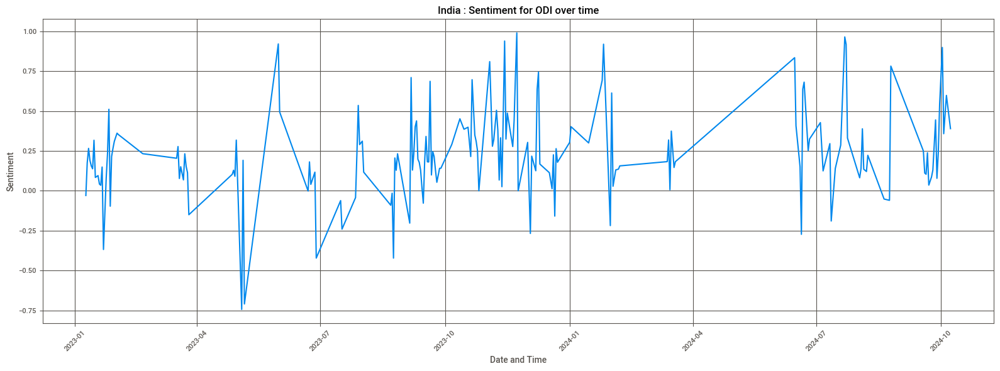

In [217]:

# we are using pandas for this, but first we need to get it into a pandas data frame structure
#series_v = india_filtered_df[['created_date','vadar_sentiment']]

Ind_sentiment_aggregated = india_filtered_df.groupby('created_date')['vadar_sentiment'].mean().reset_index()
# plotting sentiment
plt.figure(figsize=(16, 6))
plt.plot(Ind_sentiment_aggregated['created_date'],Ind_sentiment_aggregated['vadar_sentiment'],linestyle='-')
plt.title('India : Sentiment for ODI over time')
plt.xlabel('Date and Time')
plt.ylabel('Sentiment')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


In [218]:
Aus_filtered_df = filtered_df[filtered_df['Country'].apply(lambda x: 'Australia' in x)]


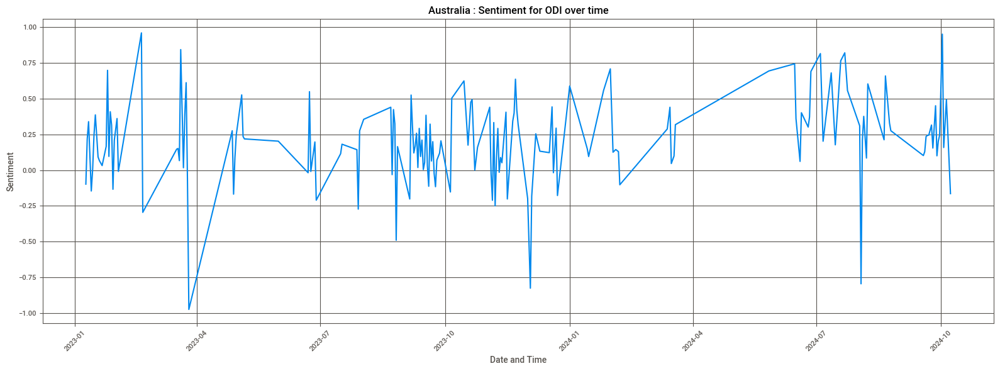

In [220]:
Aus_sentiment_aggregated = Aus_filtered_df.groupby('created_date')['vadar_sentiment'].mean().reset_index()

plt.figure(figsize=(16, 6))
plt.plot(Aus_sentiment_aggregated['created_date'],Aus_sentiment_aggregated['vadar_sentiment'],linestyle='-')
plt.title('Australia : Sentiment for ODI over time')
plt.xlabel('Date and Time')
plt.ylabel('Sentiment')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [222]:
Eng_filtered_df = filtered_df[filtered_df['Country'].apply(lambda x: 'England' in x)]


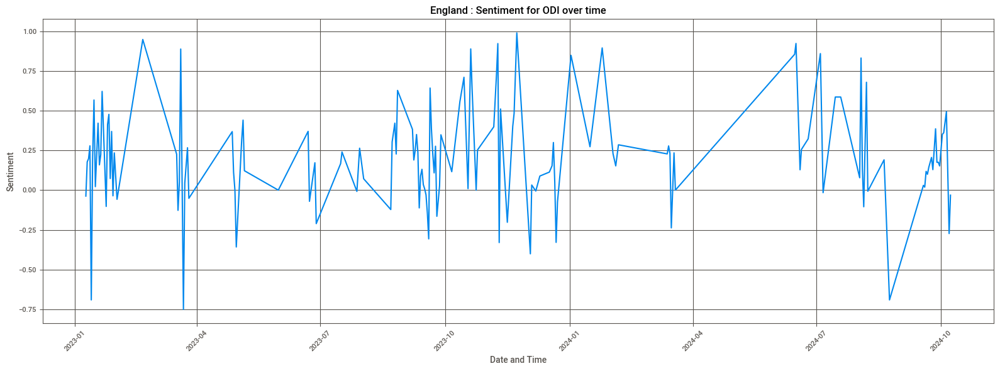

In [225]:
Eng_sentiment_aggregated = Eng_filtered_df.groupby('created_date')['vadar_sentiment'].mean().reset_index()

plt.figure(figsize=(16, 6))
plt.plot(Eng_sentiment_aggregated['created_date'],Eng_sentiment_aggregated['vadar_sentiment'],linestyle='-')

plt.title('England : Sentiment for ODI over time')
plt.xlabel('Date and Time')
plt.ylabel('Sentiment')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

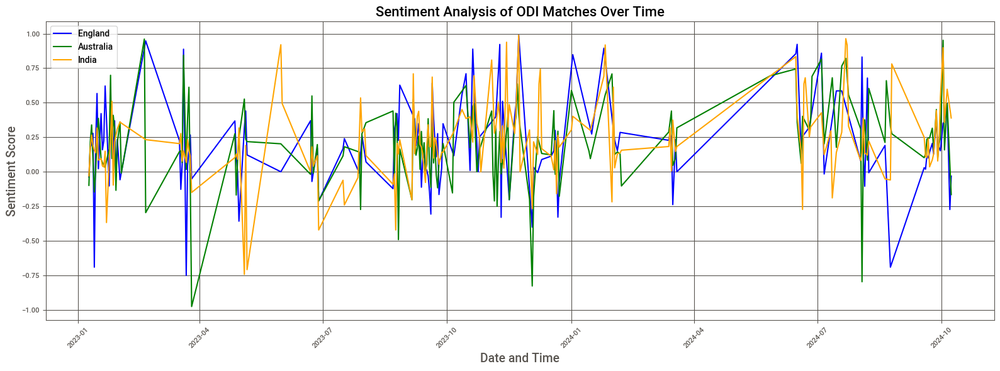

In [227]:
#Eng_sentiment_aggregated = Eng_filtered_df.groupby('created_date')['vadar_sentiment'].mean().reset_index()

plt.figure(figsize=(16, 6))
# Plotting sentiment data for each country with different colors and labels
plt.plot(Eng_sentiment_aggregated['created_date'], Eng_sentiment_aggregated['vadar_sentiment'], 
         linestyle='-', color='blue', label='England')
plt.plot(Aus_sentiment_aggregated['created_date'], Aus_sentiment_aggregated['vadar_sentiment'], 
         linestyle='-', color='green', label='Australia')
plt.plot(Ind_sentiment_aggregated['created_date'], Ind_sentiment_aggregated['vadar_sentiment'], 
         linestyle='-', color='orange', label='India')

# Adding titles and labels
plt.title('Sentiment Analysis of ODI Matches Over Time', fontsize=16)
plt.xlabel('Date and Time', fontsize=14)
plt.ylabel('Sentiment Score', fontsize=14)
plt.xticks(rotation=45)
plt.grid(True)

# Adding a legend
plt.legend()

# Adjust layout for better appearance
plt.tight_layout()
plt.show()